<a href="https://colab.research.google.com/github/evmpython/CAT010_UNIFEI_2025/blob/main/CAT010_Aula_03_parte_1_plota_mapas_precipitacao_MERGE_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
#  🟢 **Disciplina CAT010** - Aplicações dos Satélites em Ciências Atmosféricas


---

## **Aula Prática 3 - Parte 1:** $\underline{Plotando\ Mapas\ de\ Precipitação\ do\ Produto\ MERGE}$
---
**OBJETIVO:** Nesta aula prática aprenderemos como plotar *mapas de precipitação* estimado por satélite. Para isto usaremos os dados do produto MERGE disponibilizado pelo [CPTEC-INPE](http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/). Mais informações sobre o **MERGE** são encontradas no [site](http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/READ_ME-MERGE.pdf) do FTP do CPTEC.

---


**DADOS DE ENTRADA**: Arquivos de precipitação.

1. $\underline{Dados\ horários}$:
- **Tipo do dado:** matriz de 701 linhas x 701 colunas
- **Formato do dado:** arquivo grib
- **Nome do arquivo:** MERGE_CPTEC_2022090100.grib2
- **Fonte dos dados:** FTP do [CPTEC/INPE](http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/HOURLY/)

    ----------

2. $\underline{Dados\ diários}$:
- **Tipo do dado:** matriz de 701 linhas x 701 colunas
- **Formato do dado:** arquivo grib
- **Nome do arquivo:** MERGE_CPTEC_20220801.grib2
- **Fonte dos dados:** FTP do [CPTEC/INPE](http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/)

    ----------

3. $\underline{Dados\ mensais}$:
- **Tipo do dado:** matriz de 691 linhas x 474 colunas
- **Formato do dado:** arquivo NETCDF
- **Nome do arquivo:** MERGE_CPTEC_acum_apr_2004.nc
- **Fonte dos dados:** FTP do [CPTEC/INPE](http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/)


---

**DADOS DE SAÍDA:**
- **Tipo do dado:** Figura
- **Formato do dado:** arquivos JPG
- **Imagens geradas:**
    1. Fig_1_MERGE_horaria_20210101_1700.png
    2. Fig_2a_MERGE_diaria_max_med_acu_20210901_20210910.png
    3. Fig_2b_MERGE_diaria_acu_20210901_20210910.png
    4. Fig_3_MERGE_mensal_2021dec.png
    5. Fig_4a_MERGE_por_ano.png
    6. Fig_4b_MERGE_por_ano.png
    7. Fig_5_MERGE_media_anual.png
    8. Fig_6_MERGE_media_sazonal.png
    9. Fig_7_MERGE_media_mensal.png




---

**PROCEDIMENTO REALIZADO:** Os seguintes procedimentos são realizados nesse código:
1.   Instalação de bibliotecas
2.   Monta o google drive
3.   Define o caminho do google drive
4.   Importação das bibliotecas
5.   Precipitação por hora
6.   Precipitação por dia
7.   Precipitação por mês
8.   Climatologia


---
**OBSERVAÇÕES IMPORTANTES**:
1. Fazer mudanças, veja em: **### >>> MUDANÇAS AQUI <<< ###**
    - 1. Caminho do seu drive

---
- **Realizado por:** Enrique V. Mattos - 01/09/2022
- **Atualizado por:** Enrique V. Mattos - 07/08/2025


---


# **1° Passo:** Instalando as bibliotecas


In [ ]:
!pip install -q ultraplot cartopy pygrib rasterio pyproj geopandas salem descartes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.6/18.6 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.1/86.1 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 70.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 28.3 MB/s eta 0:00:00


# **2° Passo:** Montando drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **3° Passo:** Caminho do diretório - **### >>> MUDANÇAS AQUI <<< ###**

- Insira aqui o caminho da pasta do seu Google Drive onde esta o código dessa aula: `alterar aqui`

In [ ]:
# nome do diretório
dir = '/content/drive/MyDrive/00_DISPONIBILIZAÇÃO_DE_AULAS/2_SEGUNDO_SEMESTRE/CAT010 - APLICAÇÕES DOS SATÉLITES EM CIÊNCIAS ATMOSFÉRICAS/AULAS/CAT010 - PYTHON PARA SATÉLITES METEOROLÓGICOS/AULA_03_PLOTA_PRECIPITACAO/'

- Criando a pasta de saída ("output")

In [ ]:
# cria a pasta de saída com o nome "output"
import os
os.makedirs(f'{dir}output/', exist_ok=True)

# **4° Passo:** Importando as bibliotecas

In [ ]:
# Importando as bibliotecas
import pygrib                               # Leitura/escrita de arquivos GRIB (dados meteorológicos)
import numpy as np                          # Computação científica com arrays multidimensionais
import pandas as pd                         # Manipulação de dados em formato tabular (DataFrames)
import ultraplot as uplt                    # Geração de figuras de alta qualidade (biblioteca customizada)
from datetime import datetime, timedelta    # Manipulação de datas e horários
import scipy.ndimage                        # Processamento de imagens/arrays (filtros, interpolação)
import matplotlib                           # Visualização de dados (gráficos, mapas)
import cartopy.io.shapereader as shpreader  # Leitura de shapes (fronteiras, regiões geográficas)
import cartopy.crs as ccrs                  # Sistemas de referência de coordenadas (projeções de mapas)
import os                                   # Interação com o sistema operacional (arquivos, pastas)
import xarray as xr                         # Manipulação de datasets multidimensionais (ex: NetCDF, GRIB)
import glob                                 # Busca de arquivos usando padrões (ex: '*.grib')
import salem                                # Extensão do xarray para operações geoespaciais
import calendar                             # Funções auxiliares para calendário (ex: dias no mês)
import time                                 # Medição de tempo de execução e pausas

# Ignorar avisos durante a execução
import warnings
warnings.filterwarnings("ignore")     # Suprime mensagens de aviso (cuidado: pode ocultar erros)

/usr/local/lib/python3.11/dist-packages/ultraplot/__init__.py:77: UltraPlotWarning: Rebuilding font cache. This usually happens after installing or updating ultraplot.
  register_fonts(default=True)


# **PARTE 0)**: Definindo a paleta de cores para as figuras

**cria paleta de cores**

In [ ]:
# define as 24 cores da paleta
colors = ["#b4f0f0", "#96d2fa", "#78b9fa", "#3c95f5", "#1e6deb", "#1463d2", "#0fa00f",
          "#28be28", "#50f050", "#72f06e", "#b3faaa", "#fff9aa", "#ffe978", "#ffc13c",
          "#ffa200", "#ff6200", "#ff3300", "#ff1500", "#c00100", "#a50200", "#870000",
          "#653b32"]

# carrega a paleta de cores através do cmap
cmap = matplotlib.colors.ListedColormap(colors)

# seta a cor para valores acima do valor máximo
cmap.set_over('#000000')

# seta a cor para valores abaixo do valor mínimo
#cmap.set_under('#aaaaaa')
cmap.set_under('white')

# **PARTE 1)**: Precipitação por `HORA`

- **Definindo o caminho do FTP onde estão os dados por `hora`**

In [ ]:
ftp = 'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/HOURLY/'

- **Definindo a data e nome do arquivo**

In [ ]:
ano, mes, dia, hor = '2024', '04', '30', '14'

In [ ]:
file = f'{ftp}{ano}/{mes}/{dia}/MERGE_CPTEC_{ano}{mes}{dia}{hor}.grib2'
file

'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/HOURLY/2024/04/30/MERGE_CPTEC_2024043014.grib2'

- **Baixando o dado**

In [ ]:
!wget {file}

--2025-08-07 20:02:15--  http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/HOURLY/2024/04/30/MERGE_CPTEC_2024043014.grib2
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.178.56
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/HOURLY/2024/04/30/MERGE_CPTEC_2024043014.grib2 [following]
--2025-08-07 20:02:16--  https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/HOURLY/2024/04/30/MERGE_CPTEC_2024043014.grib2
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79037 (77K)
Saving to: ‘MERGE_CPTEC_2024043014.grib2’

MERGE_CPTEC_2024043 100%[===================>]  77.18K   210KB/s    in 0.4s    

2025-08-07 20:02:16 (210 KB/s) - ‘MERGE_CPTEC_2024043014.grib2’ saved [79037/79037]



- **Lendo o dado**

In [ ]:
# Lendo o arquivo
grib = pygrib.open(f'/content/MERGE_CPTEC_{ano}{mes}{dia}{hor}.grib2')

# Selecionando o campo de precipitação
grb = grib.select(name='Precipitation')[0]

In [ ]:
grb

1:Precipitation:kg m**-2 (instant):regular_ll:surface:level 0:fcst time 0 hrs:from 202404301400

In [ ]:
# Seleciona a área
lonmin = -78.0
lonmax = -30.0
latmin = -40.0
latmax =  12.0

# Selecina a extensão da imagem [min. lon, min. lat, max. lon, max. lat]
extent = [lonmin, latmin, lonmax, latmax]

# Extrai os dados para uma área específica
precip, lats, lons = grb.data(lat1=extent[1], lat2=extent[3], lon1=extent[0]+360, lon2=extent[2]+360)

In [ ]:
# mostrando o a precipitação
precip

array([[0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       ...,
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.109375],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.109375],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ]])

In [ ]:
# mostrando as latitudes
lats

array([[-39.95, -39.95, -39.95, ..., -39.95, -39.95, -39.95],
       [-39.85, -39.85, -39.85, ..., -39.85, -39.85, -39.85],
       [-39.75, -39.75, -39.75, ..., -39.75, -39.75, -39.75],
       ...,
       [ 11.75,  11.75,  11.75, ...,  11.75,  11.75,  11.75],
       [ 11.85,  11.85,  11.85, ...,  11.85,  11.85,  11.85],
       [ 11.95,  11.95,  11.95, ...,  11.95,  11.95,  11.95]])

In [ ]:
# mostrando as longitudes
lons

array([[282.05, 282.15, 282.25, ..., 326.85, 326.95, 327.05],
       [282.05, 282.15, 282.25, ..., 326.85, 326.95, 327.05],
       [282.05, 282.15, 282.25, ..., 326.85, 326.95, 327.05],
       ...,
       [282.05, 282.15, 282.25, ..., 326.85, 326.95, 327.05],
       [282.05, 282.15, 282.25, ..., 326.85, 326.95, 327.05],
       [282.05, 282.15, 282.25, ..., 326.85, 326.95, 327.05]])

- **Plota a figura**

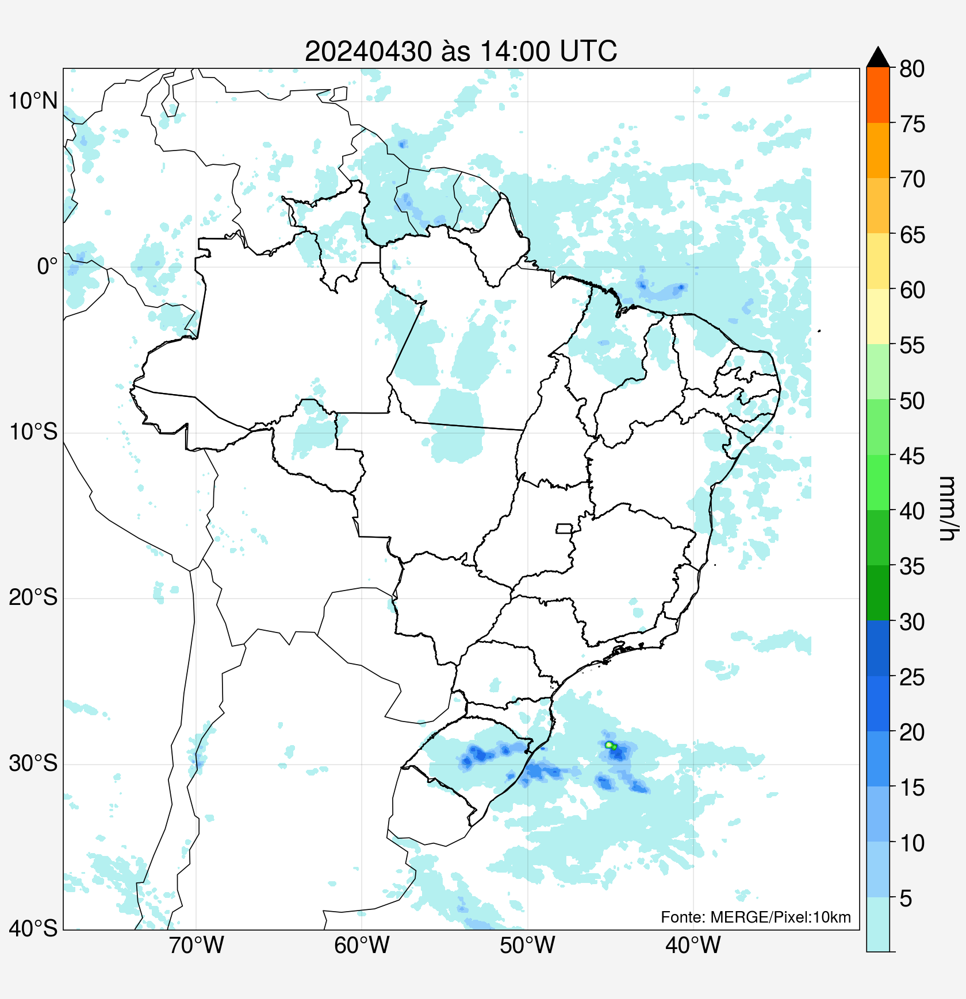

CPU times: user 11.1 s, sys: 218 ms, total: 11.3 s
Wall time: 13.8 s


In [ ]:
%%time
# cria a moldura da figura
fig, ax = uplt.subplots(figsize=(8.4,8.7), tight=True, proj='pcarree')

# define formato da figura
ax.format(coast=True, borders=True, innerborders=False,
          labels=True,
          latlines=10, lonlines=10,
          latlim=(latmin,latmax), lonlim=(lonmin,lonmax),
          title=f'{ano}{mes}{dia} às {hor}:00 UTC',
          small='20px', large='25px')
ax.text(lonmax-12, latmin+0.5, f'Fonte: MERGE/Pixel:10km', color='black', fontsize=10)

# plota a figura
map1 = ax.contourf(lons, lats, precip, cmap=cmap, levels=uplt.arange(0.01, 80, 5), extend='max')

# plota contornos dos Estados
shapefile = list(shpreader.Reader('https://github.com/evmpython/CAT010_UNIFEI_2024/raw/refs/heads/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=0.8, zorder=2)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', label='mm/h', ticks=5, ticklabelsize=15, labelsize=17, space=0.5, length=0.919)

# salva figura
fig.save(f'{dir}output/Fig_1_MERGE_horaria_{ano}{mes}{dia}_{hor}00.jpg', bbox_inches='tight', pad_inches=0, dpi=300)

# exibe a figura na tela
uplt.show()

# **PARTE 2)**: Precipitação por `DIA`

## - **Definindo o período dos dados**

In [ ]:
# ano, mes e dia INICIAL do período
anoi = 2024
mesi = 4
diai = 28

# ano, mes e dia FINAL do período
anof = 2024
mesf = 5
diaf = 2

# FTP dos dados por dia
ftp = 'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/'

## - **Baixando os dados**

In [ ]:
%%time

# Data desejada
date_in = datetime(anoi, mesi, diai)
date_ini = date_in.strftime('%Y%m%d')

date_en = datetime(anof, mesf, diaf)
date_end = date_en.strftime('%Y%m%d')

# Número de dias
n_days = date_en - date_in

# Download dos dados
for file in pd.date_range(date_ini, date_end, freq='d'):

    # extrai ano e mes
    ano = file.strftime('%Y')
    mes = file.strftime('%m')
    dia = file.strftime('%d')

    # nome do arquivo
    filename = f'MERGE_CPTEC_{ano}{mes}{dia}.grib2'

    # ftp + filename. Exemplo: http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2023/09/MERGE_CPTEC_20230920.grib2
    ftp_filename = f'{ftp}{ano}/{mes.zfill(2)}/{filename}'

    # baixando arquivo diário de chuva
    !wget {ftp_filename}

    print('\n---------------------')
    print('Downloading FTP File:')
    print('---------------------')
    print('Model: MERGE')
    print('File Name: ' + ftp_filename)

--2025-08-07 20:09:22--  http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2024/04/MERGE_CPTEC_20240428.grib2
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.178.56
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2024/04/MERGE_CPTEC_20240428.grib2 [following]
--2025-08-07 20:09:23--  https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/DAILY/2024/04/MERGE_CPTEC_20240428.grib2
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 426408 (416K)
Saving to: ‘MERGE_CPTEC_20240428.grib2.1’

MERGE_CPTEC_2024042 100%[===================>] 416.41K   680KB/s    in 0.6s    

2025-08-07 20:09:24 (680 KB/s) - ‘MERGE_CPTEC_20240428.grib2.1’ saved [426408/426408]


---------------------
---------------------
Model: MERGE
File Name: http://f

## - **Calcula a chuva máxima, média e acumulada**

In [ ]:
# Loop nos arquivos diários
for dia in pd.date_range(date_ini, date_end, freq='d'):

    # Extrai no formato '2021-10-17 00:00:00' para '20211017'
    dia = dia.strftime('%Y%m%d')

    # Monta o nome do arquivo 'MERGE_CPTEC_20211001.grib2'
    file_name = f'MERGE_CPTEC_{str(dia)}.grib2'

    # Monta o caminho e nome do arquivo '/content/input/MERGE_CPTEC_20211017.grib2'
    grib = f'/content/{file_name}'

    # Se o arquivo existe
    if (os.path.exists(grib)):

        # imprimindo na tela o arquivo atual
        print('Processando arquivo:', grib)

        # Lendo o arquivo
        grib = pygrib.open(grib)

        # Lendo o campo do modelo
        grb = grib.select(name='Precipitation')[0]

        # Extrai os dados para uma área específica
        precip, lats, lons = grb.data(lat1=extent[1],lat2=extent[3],lon1=extent[0]+360,lon2=extent[2]+360)

        # Converter de 'kg m**-2 s**-1' para 'mm/h'
        #precip = precip * 60 * 60

        # Suaviza os contornos
        precip = scipy.ndimage.zoom(precip, 3)
        lons = scipy.ndimage.zoom(lons, 3)
        lats = scipy.ndimage.zoom(lats, 3)

        # Se é o primeiro ciclo, cria um array que guardará os valores médios
        if (dia == date_ini):
            precip_sum = np.zeros((precip.shape[0], precip.shape[1]))
            precip_max = np.full((precip.shape[0], precip.shape[1]), -9999)
            precip_min = np.full((precip.shape[0], precip.shape[1]),  9999)

        # Soma os valores
        precip_sum = precip_sum + precip

        # Extrai o valor máximo
        precip_max = np.maximum(precip, precip_max)

        # Extrai o valor mínimo
        precip_min = np.minimum(precip, precip_min)

# Calcula o valor médio
precip_med = precip_sum / n_days.days

Processando arquivo: /content/MERGE_CPTEC_20240428.grib2
Processando arquivo: /content/MERGE_CPTEC_20240429.grib2
Processando arquivo: /content/MERGE_CPTEC_20240430.grib2
Processando arquivo: /content/MERGE_CPTEC_20240501.grib2
Processando arquivo: /content/MERGE_CPTEC_20240502.grib2


In [ ]:
# colocar chuva abaixo de 1 mm/h como "Not a Number"
precip_min[precip_min < 1] = np.nan
precip_max[precip_max < 1] = np.nan
precip_med[precip_med < 1] = np.nan
precip_sum[precip_sum < 1] = np.nan

## - **Plota imagem**: Precipitação Máxima, Média e Acumulada  

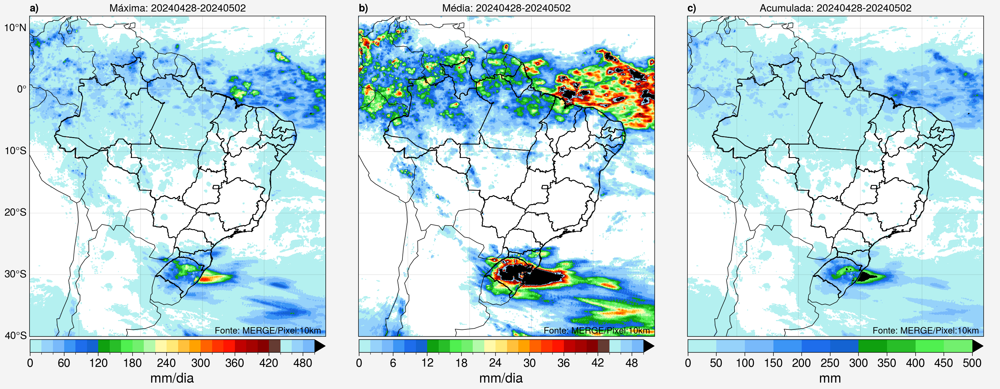

CPU times: user 40.5 s, sys: 551 ms, total: 41.1 s
Wall time: 43.3 s


In [ ]:
%%time
# Plotando a figura
fig, ax = uplt.subplots(axwidth=5, axheight=5, tight=True, proj='pcarree', ncols=3, sharey=True, sharex=True)

# define formato da figura
ax.format(coast=True, borders=True, innerborders=False,
          labels=True,
          latlines=10, lonlines=10,
          latlim=(latmin,latmax),
          lonlim=(lonmin,lonmax),
          abc=True, abcstyle='a)', abcsize=5,
          small='16px', large='16px')

#-------------------------------#
#        Plot 1: Máxima
#-------------------------------#
# plota mapa
map1 = ax[0].contourf(lons, lats, precip_max, cmap=cmap, levels=uplt.arange(0, 500, 20), extend='max')

# plota título de figura
ax[0].format(title=f'Máxima: {date_ini}-{date_end}')
ax[0].text(lonmax-18, latmin+0.5, f'Fonte: MERGE/Pixel:10km', color='black', fontsize=10)

# plota barra de cores
ax[0].colorbar(map1, loc='b', label='mm/dia', ticklabelsize=13, labelsize=15, space=0.4, length=0.92, orientation='horizontal')

# plota contornos dos Estados
shapefile = list(shpreader.Reader('https://github.com/evmpython/CAT010_UNIFEI_2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax[0].add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=0.8, zorder=2)

#-------------------------------#
#       Plot 2: Média
#-------------------------------#
# plota mapa
map2 = ax[1].contourf(lons, lats, precip_med, cmap=cmap, levels=uplt.arange(0, 50, 2), extend='max')

# plota título de figura
ax[1].format(title=f'Média: {date_ini}-{date_end}')
ax[1].text(lonmax-18, latmin+0.5, f'Fonte: MERGE/Pixel:10km', color='black', fontsize=10)

# plota barra de cores
ax[1].colorbar(map2, loc='b', label='mm/dia', ticklabelsize=13, labelsize=15, space=0.4, length=0.92, orientation='horizontal')

# plota contornos dos Estados
shapefile = list(shpreader.Reader('https://github.com/evmpython/CAT010_UNIFEI_2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax[1].add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=0.8, zorder=2)

#-------------------------------#
#      Plot 3: Acumulada
#-------------------------------#
# plota mapa
map3 = ax[2].contourf(lons, lats, precip_sum, cmap=cmap, levels=uplt.arange(0, 500, 50), extend='max')

# plota título de figura
ax[2].format(title=f'Acumulada: {date_ini}-{date_end}')
ax[2].text(lonmax-18, latmin+0.5, f'Fonte: MERGE/Pixel:10km', color='black', fontsize=10)

# plota barra de cores
ax[2].colorbar(map3, loc='b', label='mm', ticklabelsize=13, labelsize=15, space=0.4, length=0.92, orientation='horizontal')

# plota contornos dos Estados
shapefile = list(shpreader.Reader('https://github.com/evmpython/CAT010_UNIFEI_2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax[2].add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=0.8, zorder=2)
#-------------------------------#

# salva figura
fig.save(f'{dir}output/Fig_2a_MERGE_diaria_max_med_acu_{date_ini}_{date_end}.jpg', bbox_inches='tight', pad_inches=0, dpi=300)

# exibe a figura na tela
uplt.show()

## - **Plota imagem**: Precipitação Acumulada  

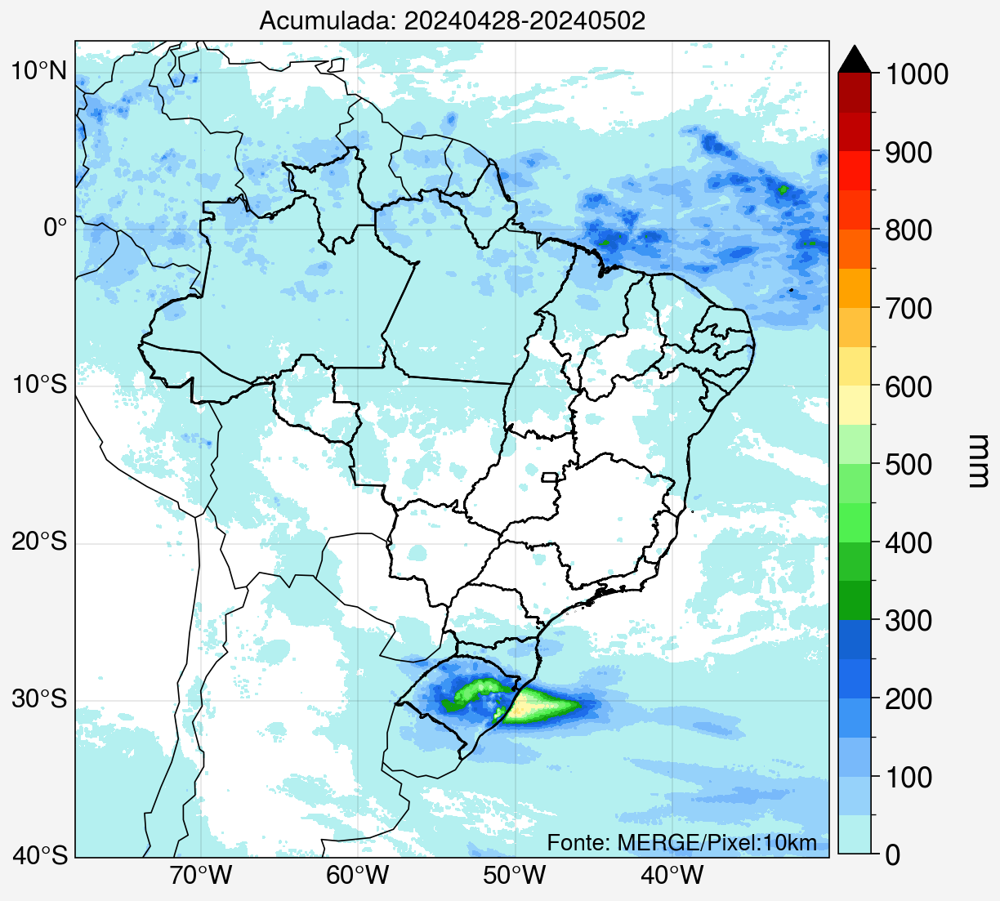

In [ ]:
# Plotando a figura
fig, ax = uplt.subplots(axwidth=5, axheight=5, tight=True, proj='pcarree')

# define formato da figura
ax.format(coast=True, borders=True, innerborders=False,
          labels=True,
          latlines=10, lonlines=10,
          latlim=(latmin,latmax),
          lonlim=(lonmin,lonmax),
          small='16px', large='16px', abc=False)

# plota mapa
map1 = ax.contourf(lons,
                   lats,
                   precip_sum,
                   cmap=cmap,
                   levels=uplt.arange(0, 1000, 50),
                   extend='max')

# plota título de figura
ax.format(title=f'Acumulada: {date_ini}-{date_end}')
ax.text(lonmax-18, latmin+0.5, f'Fonte: MERGE/Pixel:10km', color='black', fontsize=10)

# plota contornos dos Estados
shapefile = list(shpreader.Reader('https://github.com/evmpython/CAT010_UNIFEI_2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=0.8, zorder=2)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', label='mm', ticks=100, ticklabelsize=13, labelsize=15, space=-1.1, length=0.99)

# salva figura
fig.save(f'{dir}output/Fig_2b_MERGE_diaria_acu_{date_ini}_{date_end}.jpg', bbox_inches='tight', pad_inches=0, dpi=300)

# exibe a figura na tela
uplt.show()

# **PARTE 3)**: Precipitação por `MÊS`

- **Definindo o caminho do FTP onde estão os dados por mês**

In [ ]:
ftp = 'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/'

- **Definindo ano, mês e monta o nome do arquivo**

In [ ]:
ano, mes = '2024', 'apr'

In [ ]:
file = f'{ftp}MERGE_CPTEC_acum_{mes}_{ano}.nc'
file

'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_apr_2024.nc'

- **Baixando o dado**: os arquivos possuem o nome que indica o mês e ano, como exemplo **MERGE_CPTEC_acum_apr_2001.nc**

In [ ]:
!wget {file}

--2025-08-07 20:10:31--  http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_apr_2024.nc
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.178.56
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_apr_2024.nc [following]
--2025-08-07 20:10:32--  https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_apr_2024.nc
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3064112 (2.9M) [application/x-netcdf]
Saving to: ‘MERGE_CPTEC_acum_apr_2024.nc’

MERGE_CPTEC_acum_ap 100%[===================>]   2.92M  2.97MB/s    in 1.0s    

2025-08-07 20:10:33 (2.97 MB/s) - ‘MERGE_CPTEC_acum_apr_202

- **Lendo o dado**

In [ ]:
ds = xr.open_dataset(f'/content/MERGE_CPTEC_acum_{mes}_{ano}.nc')

- **Visualizando o dado**

In [ ]:
# mostrando os dados
ds

<xarray.Dataset> Size: 3MB
Dimensions:  (time: 1, lat: 691, lon: 551)
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * time     (time) datetime64[ns] 8B 2024-04-01T12:00:00
Data variables:
    pacum    (time, lat, lon) float64 3MB ...

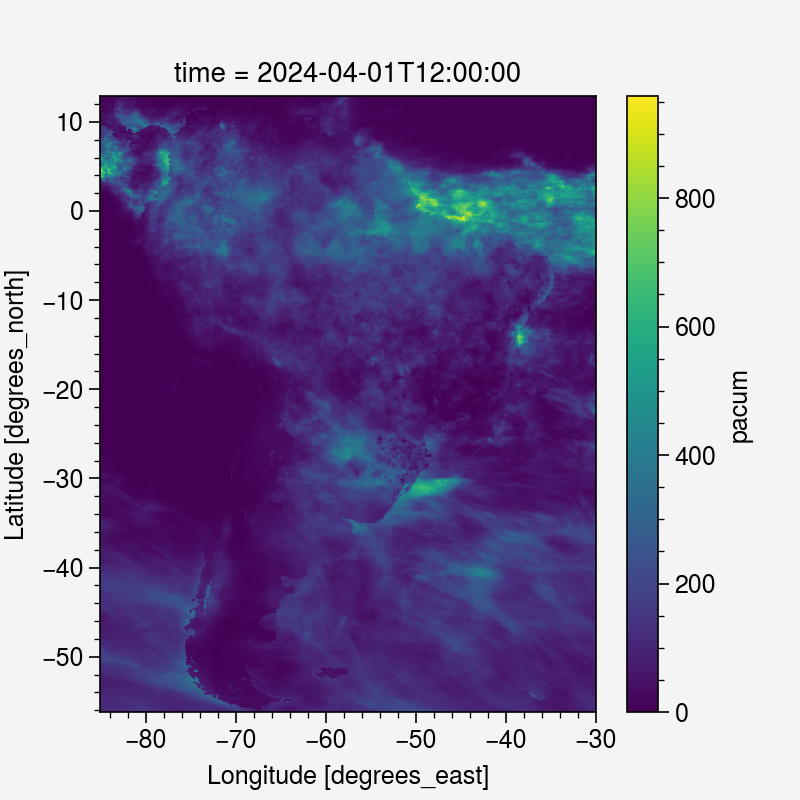

In [ ]:
# plotando uma figura simples
ds['pacum'].plot()

- **Plota a figura**

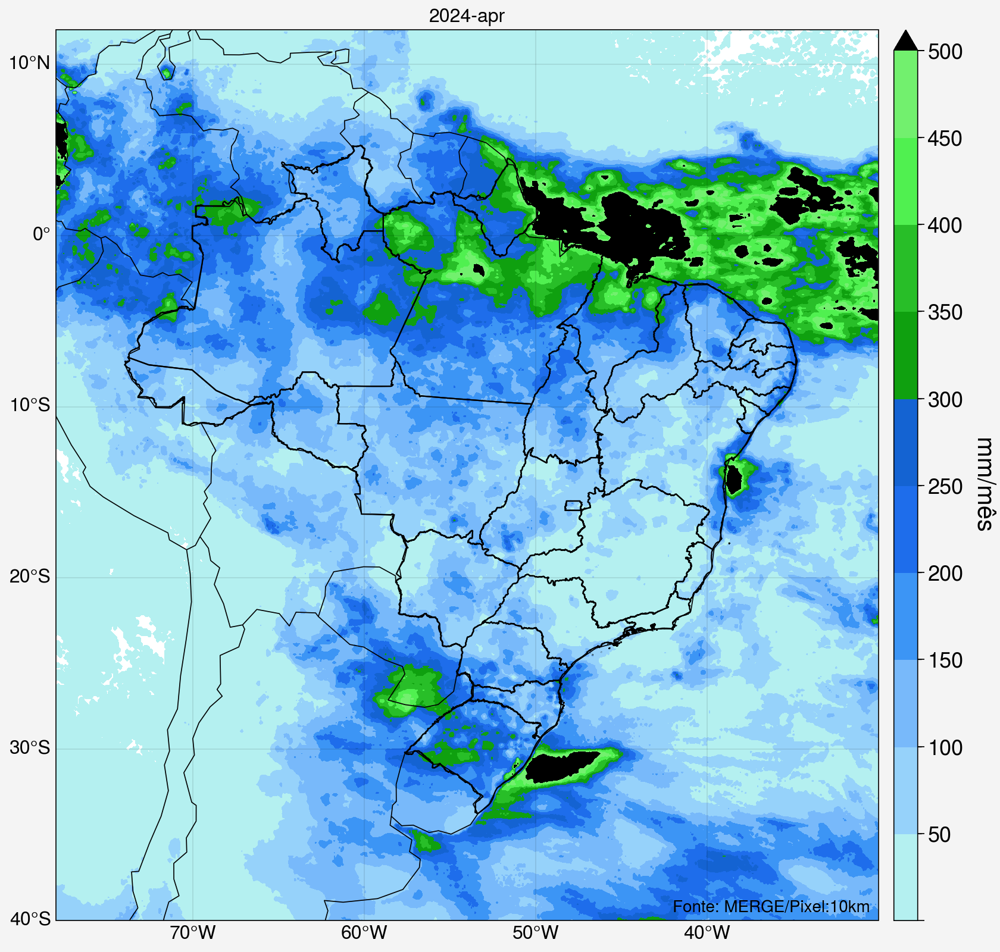

CPU times: user 12 s, sys: 135 ms, total: 12.2 s
Wall time: 13 s


In [ ]:
%%time
# cria a moldura da figura
fig, ax = uplt.subplots(figsize=(8.4,8), tight=True, proj='pcarree')

# define formato da figura
ax.format(coast=True, borders=True, innerborders=False,
          labels=True,
          latlines=10, lonlines=10,
          latlim=(latmin,latmax), lonlim=(lonmin,lonmax),
          title=f'{ano}-{mes}',
          small='16px', large='16px', abc=False)
ax.text(lonmax-12, latmin+0.5, f'Fonte: MERGE/Pixel:10km', color='black', fontsize=10)

# plota a figura
map1 = ax.contourf(ds['lon'], ds['lat'], ds['pacum'][0,:,:], cmap=cmap, levels=uplt.arange(0.01, 500, 50), extend='max')

# plota contornos dos Estados
shapefile = list(shpreader.Reader('https://github.com/evmpython/CAT010_UNIFEI_2024/raw/main/shapefiles/BR_UF_2019.shp').geometries())
ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=0.8, zorder=2)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', label='mm/mês', ticks=50, ticklabelsize=13, labelsize=15, space=-1.6)

# salva figura
fig.save(f'{dir}output/Fig_3_MERGE_mensal_{ano}{mes}.jpg', bbox_inches='tight', pad_inches=0, dpi=300)

# exibe a figura na tela
uplt.show()

# **PARTE 4)**: `Climatologia`

##**- Definindo o caminho do FTP onde estão os dados climatológicos**

In [ ]:
ftp = 'http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/'

##**- Baixa os dados mensais**

In [ ]:
# define o nome dos meses
meses = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

In [ ]:
# define o ano inicial e final
ano_inicial = 2019
ano_final = 2024

Demora 2 min para baixar os dados mensais de de 2019 a 2024.

In [ ]:
%%time
# loop dos anos e meses
for ano in range(ano_inicial, ano_final+1): # loop dos anos
    for mes in meses: # loop dos meses

        print('-------------------------------------------------------------------------------------')
        print(f'BAIXANDO ARQUIVO: {ano}-{mes}')
        print('---------------------------------------------------------------------------------- \n')

        # monta nome do arquivo
        file = f'{ftp}MERGE_CPTEC_acum_{mes}_{ano}.nc'

        # baixa arquivo
        !wget {file}

-------------------------------------------------------------------------------------
BAIXANDO ARQUIVO: 2019-jan
---------------------------------------------------------------------------------- 

--2025-08-07 20:10:50--  http://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_jan_2019.nc
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.178.56
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_jan_2019.nc [following]
--2025-08-07 20:10:50--  https://ftp.cptec.inpe.br/modelos/tempo/MERGE/GPM/CLIMATOLOGY/MONTHLY_ACCUMULATED_YEARLY/MERGE_CPTEC_acum_jan_2019.nc
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.178.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3064112 (2.9M) [applica

##**- Leitura dos dados**. Iremos ler os arquivos do ano todo de uma única vez, e produziremos um único conjunto de dados. Para isto usaremos mais uma vez a biblioteca [**xarray**](https://docs.xarray.dev/en/stable/) com a função [**open_mfdataset**](https://docs.xarray.dev/en/stable/generated/xarray.open_mfdataset.html).

In [ ]:
# mostrando um dos arquivos
ds = xr.open_dataset('/content/MERGE_CPTEC_acum_may_2024.nc')
ds

<xarray.Dataset> Size: 3MB
Dimensions:  (time: 1, lat: 691, lon: 551)
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * time     (time) datetime64[ns] 8B 2024-05-01T12:00:00
Data variables:
    pacum    (time, lat, lon) float64 3MB ...

In [ ]:
# lista dos arquivos que foram baixados
files=[]
for i in range(ano_inicial, ano_final+1):
    files = files + glob.glob(f'/content/MERGE_CPTEC_acum*_{i}.nc')
files

['/content/MERGE_CPTEC_acum_jan_2019.nc',
 '/content/MERGE_CPTEC_acum_may_2019.nc',
 '/content/MERGE_CPTEC_acum_jun_2019.nc',
 '/content/MERGE_CPTEC_acum_mar_2019.nc',
 '/content/MERGE_CPTEC_acum_dec_2019.nc',
 '/content/MERGE_CPTEC_acum_apr_2019.nc',
 '/content/MERGE_CPTEC_acum_sep_2019.nc',
 '/content/MERGE_CPTEC_acum_jul_2019.nc',
 '/content/MERGE_CPTEC_acum_feb_2019.nc',
 '/content/MERGE_CPTEC_acum_nov_2019.nc',
 '/content/MERGE_CPTEC_acum_aug_2019.nc',
 '/content/MERGE_CPTEC_acum_oct_2019.nc',
 '/content/MERGE_CPTEC_acum_jun_2020.nc',
 '/content/MERGE_CPTEC_acum_mar_2020.nc',
 '/content/MERGE_CPTEC_acum_oct_2020.nc',
 '/content/MERGE_CPTEC_acum_may_2020.nc',
 '/content/MERGE_CPTEC_acum_sep_2020.nc',
 '/content/MERGE_CPTEC_acum_dec_2020.nc',
 '/content/MERGE_CPTEC_acum_jan_2020.nc',
 '/content/MERGE_CPTEC_acum_apr_2020.nc',
 '/content/MERGE_CPTEC_acum_nov_2020.nc',
 '/content/MERGE_CPTEC_acum_feb_2020.nc',
 '/content/MERGE_CPTEC_acum_aug_2020.nc',
 '/content/MERGE_CPTEC_acum_jul_20

In [ ]:
# quantidade de arquivos
len(files)

72

In [ ]:
# lendo os dados
chuva_por_mes = xr.open_mfdataset(files, concat_dim='time', combine='nested')

In [ ]:
# mostrando os dados
chuva_por_mes

<xarray.Dataset> Size: 219MB
Dimensions:  (time: 72, lat: 691, lon: 551)
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * time     (time) datetime64[ns] 576B 2019-01-01T12:00:00 ... 2024-01-01T12...
Data variables:
    pacum    (time, lat, lon) float64 219MB dask.array<chunksize=(1, 691, 551), meta=np.ndarray>

In [ ]:
# mostrando os tempos
chuva_por_mes['time']

<xarray.DataArray 'time' (time: 72)> Size: 576B
array(['2019-01-01T12:00:00.000000000', '2019-05-01T12:00:00.000000000',
       '2019-06-01T12:00:00.000000000', '2019-03-01T12:00:00.000000000',
       '2019-12-01T12:00:00.000000000', '2019-04-01T12:00:00.000000000',
       '2019-09-01T12:00:00.000000000', '2019-07-01T12:00:00.000000000',
       '2019-02-01T12:00:00.000000000', '2019-11-01T12:00:00.000000000',
       '2019-08-01T12:00:00.000000000', '2019-10-01T12:00:00.000000000',
       '2020-06-01T12:00:00.000000000', '2020-03-01T12:00:00.000000000',
       '2020-10-01T12:00:00.000000000', '2020-05-01T12:00:00.000000000',
       '2020-09-01T12:00:00.000000000', '2020-12-01T12:00:00.000000000',
       '2020-01-01T12:00:00.000000000', '2020-04-01T12:00:00.000000000',
       '2020-11-01T12:00:00.000000000', '2020-02-01T12:00:00.000000000',
       '2020-08-01T12:00:00.000000000', '2020-07-01T12:00:00.000000000',
       '2021-09-01T12:00:00.000000000', '2021-01-01T12:00:00.000000000',
       '2021-05-01T12:00:00.000000000', '2021-03-01T12:00:00.000000000',
       '2021-06-01T12:00:00.000000000', '2021-08-01T12:00:00.000000000',
       '2021-02-01T12:00:00.000000000', '2021-11-01T12:00:00.000000000',
       '2021-10-01T12:00:00.000000000', '2021-04-01T12:00:00.000000000',
       '2021-07-01T12:00:00.000000000', '2021-12-01T12:00:00.000000000',
       '2022-12-01T12:00:00.000000000', '2022-06-01T12:00:00.000000000',
       '2022-04-01T12:00:00.000000000', '2022-02-01T12:00:00.000000000',
       '2022-11-01T12:00:00.000000000', '2022-01-01T12:00:00.000000000',
       '2022-09-01T12:00:00.000000000', '2022-08-01T12:00:00.000000000',
       '2022-07-01T12:00:00.000000000', '2022-10-01T12:00:00.000000000',
       '2022-05-01T12:00:00.000000000', '2022-03-01T12:00:00.000000000',
       '2023-11-01T12:00:00.000000000', '2023-09-01T12:00:00.000000000',
       '2023-06-01T12:00:00.000000000', '2023-04-01T12:00:00.000000000',
       '2023-10-01T12:00:00.000000000', '2023-05-01T12:00:00.000000000',
       '2023-12-01T12:00:00.000000000', '2023-02-01T12:00:00.000000000',
       '2023-07-01T12:00:00.000000000', '2023-01-01T12:00:00.000000000',
       '2023-08-01T12:00:00.000000000', '2023-03-01T12:00:00.000000000',
       '2024-10-01T12:00:00.000000000', '2024-07-01T12:00:00.000000000',
       '2024-06-01T12:00:00.000000000', '2024-03-01T12:00:00.000000000',
       '2024-05-01T12:00:00.000000000', '2024-12-01T12:00:00.000000000',
       '2024-02-01T12:00:00.000000000', '2024-08-01T12:00:00.000000000',
       '2024-04-01T12:00:00.000000000', '2024-11-01T12:00:00.000000000',
       '2024-09-01T12:00:00.000000000', '2024-01-01T12:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 576B 2019-01-01T12:00:00 ... 2024-01-01T12...
Attributes:
    long_name:  Time

##**- Alguns gráficos básicos**

In [ ]:
chuva_por_mes

<xarray.Dataset> Size: 219MB
Dimensions:  (time: 72, lat: 691, lon: 551)
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * time     (time) datetime64[ns] 576B 2019-01-01T12:00:00 ... 2024-01-01T12...
Data variables:
    pacum    (time, lat, lon) float64 219MB dask.array<chunksize=(1, 691, 551), meta=np.ndarray>

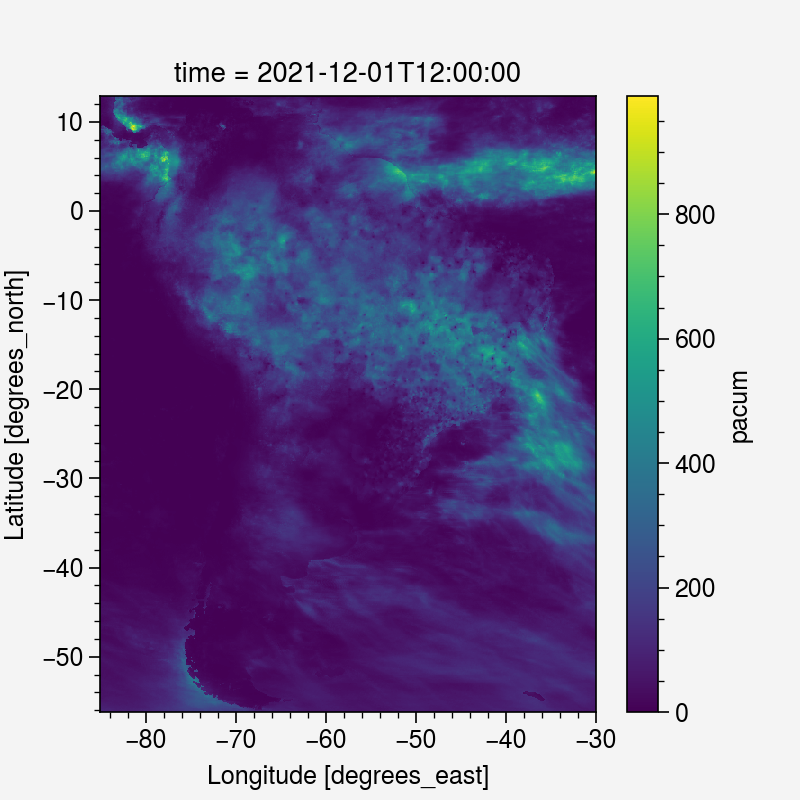

In [ ]:
# selecionando o mês pelo NOME
chuva_por_mes['pacum'].loc['2021-12-01T12:00:00.000000000'].plot()

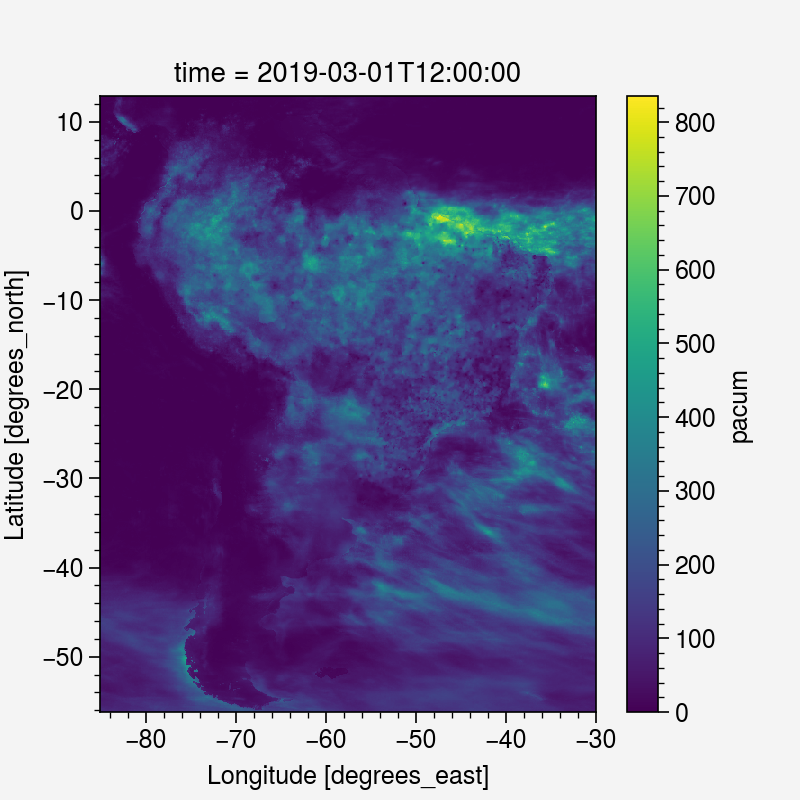

In [ ]:
# selecionando o mês pelo ÍNDICE
chuva_por_mes['pacum'].isel(time=3).plot()

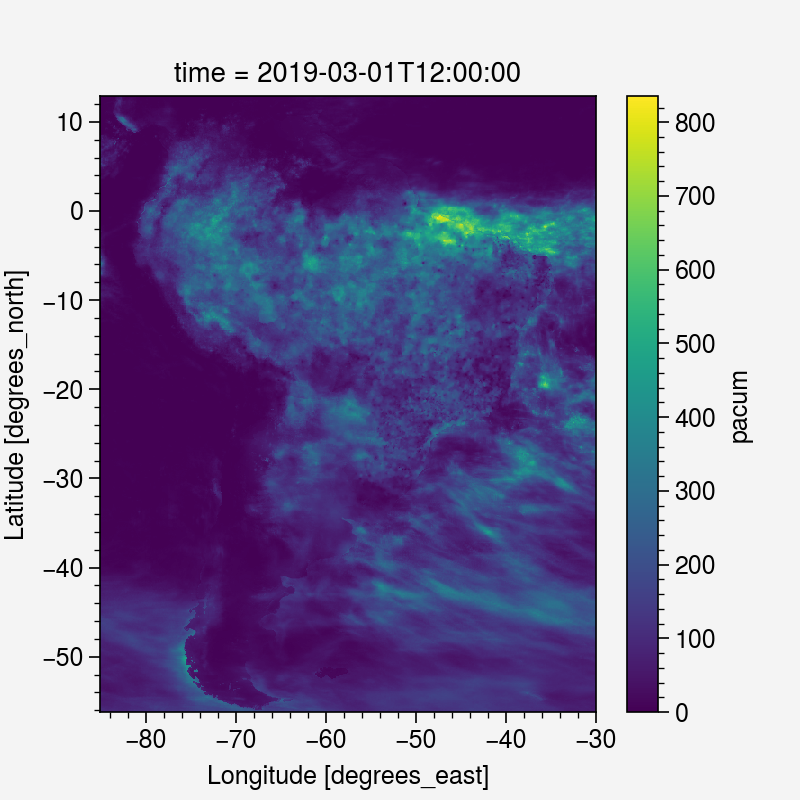

In [ ]:
# selecionando o mês pelo ÍNDICE da matriz
chuva_por_mes['pacum'][3, :, :].plot()

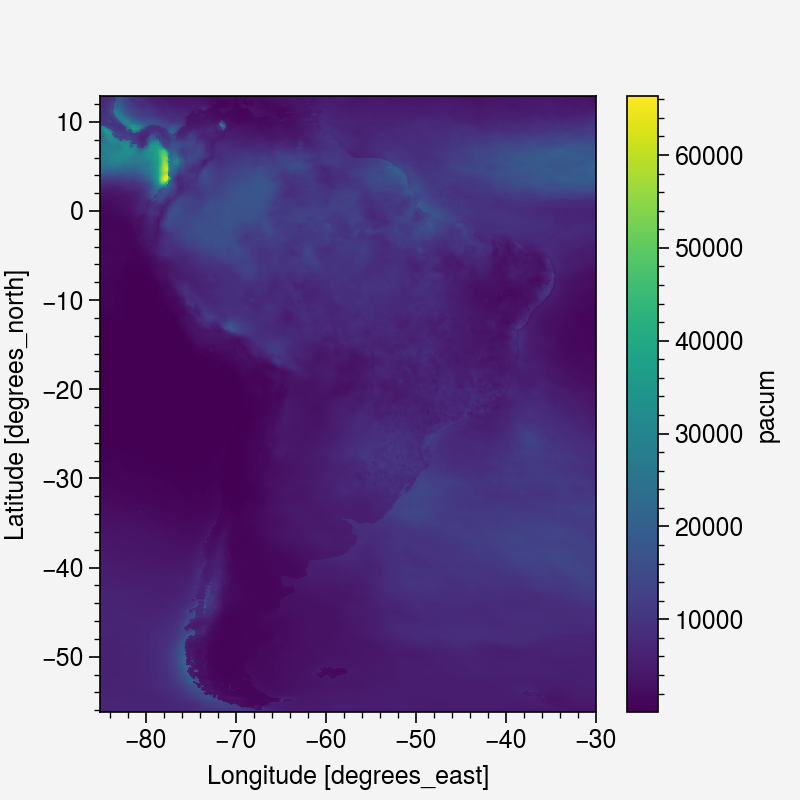

In [ ]:
# fazendo uma soma no tempo
chuva_por_mes['pacum'].sum(dim='time').plot()

##**- Alguns gráficos mais sofiscados e detalhados**

###**Baixando e lendo o shapefile de um determinado Estado do Brasil**

**Baixando o shapefile**

In [ ]:
# sigla do estado
sigla_estado = 'MG'

# url
url = 'https://github.com/evmpython/shapefile/raw/main/UFs/'

# caminho completo do arquivo. Exemplo: https://github.com/evmpython/shapefile/raw/main/UFs/MG/MG_UF_2019.shp
file1 = f'{url}{sigla_estado}/{sigla_estado}_UF_2019.cpg'
file2 = f'{url}{sigla_estado}/{sigla_estado}_UF_2019.dbf'
file3 = f'{url}{sigla_estado}/{sigla_estado}_UF_2019.prj'
file4 = f'{url}{sigla_estado}/{sigla_estado}_UF_2019.shp'
file5 = f'{url}{sigla_estado}/{sigla_estado}_UF_2019.shx'

# baixa o shapefile
!wget -c {file1}
!wget -c {file2}
!wget -c {file3}
!wget -c {file4}
!wget -c {file5}

--2025-08-07 20:13:15--  https://github.com/evmpython/shapefile/raw/main/UFs/MG/MG_UF_2019.cpg
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/evmpython/shapefile/main/UFs/MG/MG_UF_2019.cpg [following]
--2025-08-07 20:13:15--  https://raw.githubusercontent.com/evmpython/shapefile/main/UFs/MG/MG_UF_2019.cpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5 [text/plain]
Saving to: ‘MG_UF_2019.cpg’

MG_UF_2019.cpg      100%[===================>]       5  --.-KB/s    in 0s      

2025-08-07 20:13:15 (269 KB/s) - ‘MG_UF_2019.cpg’ saved [5/5]

--2025-08-07 20:13:15--  https://github.com/evmpython/shap

**Leitura do shapefile**

In [ ]:
# leitura do shapefile com a biblioteca SALEM
shp = salem.read_shapefile(f'/content/{sigla_estado}_UF_2019.shp')

In [ ]:
# mostra o shapefile que foi lido
shp

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,geometry,min_x,max_x,min_y,max_y
0,31,Minas Gerais,MG,Sudeste,"POLYGON ((-50.74208 -19.21384, -50.74241 -19.2...",-51.046082,-39.856829,-22.922755,-14.233181


In [ ]:
# seleciona os limites da imagem
lonmin = float(shp['min_x'])
lonmax = float(shp['max_x'])

latmin = float(shp['min_y'])
latmax = float(shp['max_y'])

print(lonmin, lonmax)
print(latmin, latmax)

-51.046081811 -39.856828891
-22.92275526 -14.233180666


###**a) Por ano**

**Gera estatísticas**

In [ ]:
chuva_por_mes

<xarray.Dataset> Size: 219MB
Dimensions:  (time: 72, lat: 691, lon: 551)
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * time     (time) datetime64[ns] 576B 2019-01-01T12:00:00 ... 2024-01-01T12...
Data variables:
    pacum    (time, lat, lon) float64 219MB dask.array<chunksize=(1, 691, 551), meta=np.ndarray>

In [ ]:
# reamostra o dado
chuva_por_ano = chuva_por_mes['pacum'].groupby('time.year').sum('time')

In [ ]:
# recorta o dado para região
chuva_por_ano = chuva_por_ano.salem.roi(shape=shp)

In [ ]:
# mostra o dado
chuva_por_ano

<xarray.DataArray 'pacum' (year: 6, lat: 691, lon: 551)> Size: 18MB
dask.array<where, shape=(6, 691, 551), dtype=float64, chunksize=(1, 691, 551), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * year     (year) int64 48B 2019 2020 2021 2022 2023 2024
Attributes:
    pyproj_srs:  +proj=longlat +datum=WGS84 +no_defs

**Plota gráfico**

In [ ]:
len(chuva_por_ano)

6

Processando o ano: .... 2019
Processando o ano: .... 2020
Processando o ano: .... 2021
Processando o ano: .... 2022
Processando o ano: .... 2023
Processando o ano: .... 2024


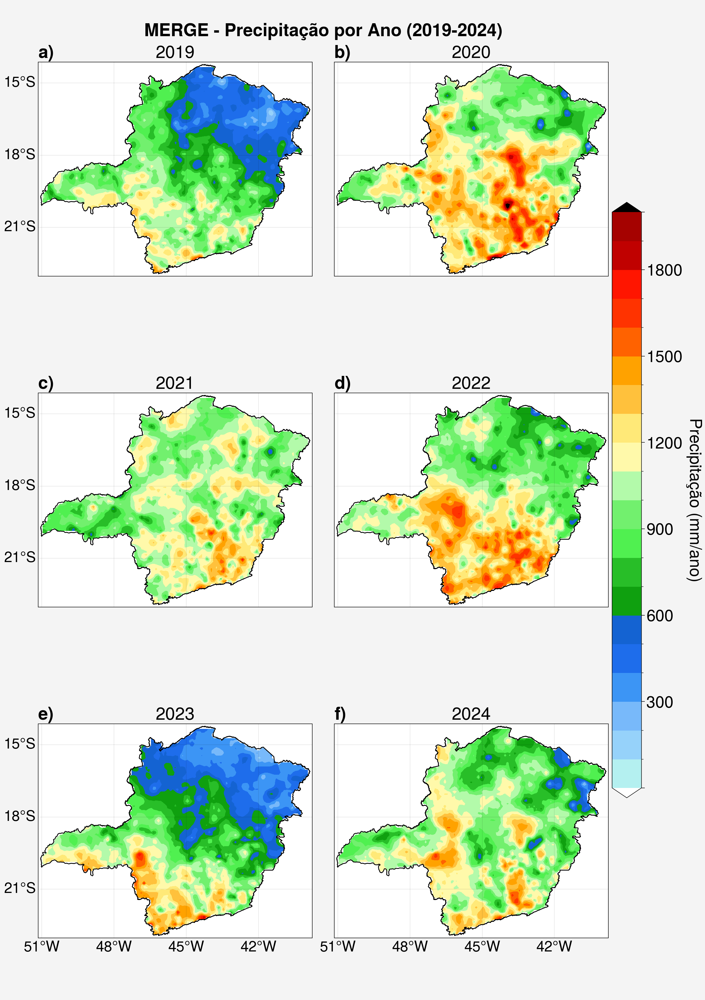

In [ ]:
# cria a moldura da figura
fig, ax = uplt.subplots(figsize=(12, 17), nrows=3, ncols=2, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          latlines=3, lonlines=3,
          latlim=(latmin-0.10, latmax+0.10), lonlim=(lonmin-0.10, lonmax+0.10),
          suptitle=f'MERGE - Precipitação por Ano ({ano_inicial}-{ano_final})',
          abc=True, abcstyle='a)', abcsize=5,
          small='25px', large='30px')

# loop dos anos
for i in range(len(chuva_por_ano)):

  # extrai o nome do ano
  ano = str(chuva_por_ano['year'][i].values)[0:4]

  # exibe na tela o ano que esta sendo processado
  print(f'Processando o ano: .... {ano}')

  # plota figura
  map1 = ax[i].contourf(chuva_por_ano['lon'],
                        chuva_por_ano['lat'],
                        chuva_por_ano[i,:,:],
                        cmap=cmap,
                        levels=uplt.arange(0.01, 2000, 100),
                        extend='both')

  # plota titulo de cada figura
  if(i == 0): ax[i].format(title=ano, labels = [True, False, False, False])
  if(i == 2): ax[i].format(title=ano, labels = [True, False, False, False])
  if(i == 1): ax[i].format(title=ano, labels = [False, False, False, False])
  if(i == 3): ax[i].format(title=ano, labels = [False, False, False, False])
  if(i == 4): ax[i].format(title=ano, labels = [True, False, True, False])
  if(i == 5): ax[i].format(title=ano, labels = [False, False, True, False])

  # plota contorno do Estado de MG
  shapefile = list(shpreader.Reader(f'/content/{sigla_estado}_UF_2019.shp').geometries())
  ax[i].add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black',facecolor='none', linewidth=1.0)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', orientation='vertical', label='Precipitação (mm/ano)', ticks=300, ticklabelsize=20, labelsize=20, space=0.5, length=0.60, width=0.5, )

# salva figura
fig.savefig(f'{dir}output/Fig_4a_MERGE_por_ano.jpg', transparent=True, dpi=300, bbox_inches="tight", pad_inches=0.1)

Uma outra forma é **retirar** os labels dos eixos das latitudes e longitudes.

Processando o ano: .... 2019
Processando o ano: .... 2020
Processando o ano: .... 2021
Processando o ano: .... 2022
Processando o ano: .... 2023
Processando o ano: .... 2024


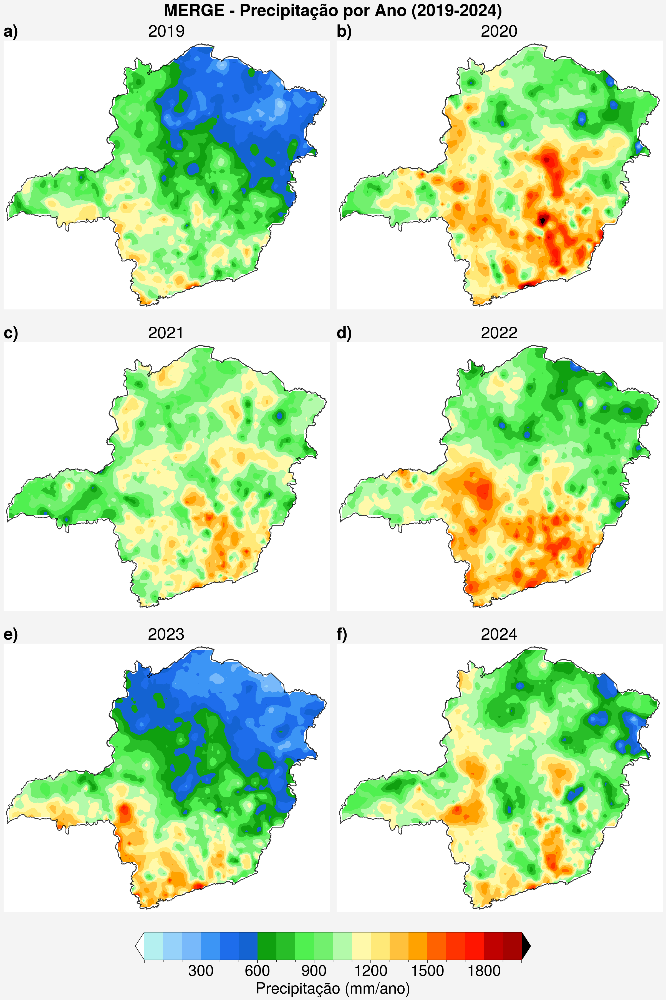

In [ ]:
# cria a moldura da figura
fig, ax = uplt.subplots(figsize=(12, 18), nrows=3, ncols=2, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          latlines=3, lonlines=3,
          latlim=(latmin-0.10, latmax+0.10), lonlim=(lonmin-0.10, lonmax+0.10),
          suptitle=f'MERGE - Precipitação por Ano ({ano_inicial}-{ano_final})',
          abc=True, abcstyle='a)', abcsize=5,
          small='25px', large='30px',
          linewidth=0, grid=False)

# loop dos anos
for i in range(len(chuva_por_ano)):

  # extrai o nome do ano
  ano = str(chuva_por_ano['year'][i].values)[0:4]

  # exibe na tela o ano que esta sendo processado
  print(f'Processando o ano: .... {ano}')

  # plota figura
  map1 = ax[i].contourf(chuva_por_ano['lon'], chuva_por_ano['lat'], chuva_por_ano[i,:,:],
                        cmap=cmap,
                        levels=uplt.arange(0.01, 2000, 100),
                        extend='both')

  # plota titulo de cada figura
  if(i == 0): ax[i].format(title=ano, labels = False)
  if(i == 2): ax[i].format(title=ano, labels = False)
  if(i == 1): ax[i].format(title=ano, labels = False)
  if(i == 3): ax[i].format(title=ano, labels = False)
  if(i == 4): ax[i].format(title=ano, labels = False)
  if(i == 5): ax[i].format(title=ano, labels = False)

  # plota contorno do Estado de MG
  shp.plot(edgecolor='black', facecolor='none', linewidth=1, alpha=0.8, ax=ax[i])

# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='Precipitação (mm/ano)', ticks=300, ticklabelsize=20, labelsize=20, space=0.5, length=0.60, width=0.5)

# salva figura
fig.savefig(f'{dir}output/Fig_4b_MERGE_por_ano.jpg', transparent=True, dpi=300, bbox_inches="tight", pad_inches=0.1)

###**b) Anual**

**Gera estatísticas**

In [ ]:
# reamostra o dado
chuva_media_anual = chuva_por_ano.mean(dim='year')

In [ ]:
# recorta o dado para região
chuva_media_anual = chuva_media_anual.salem.roi(shape=shp)

In [ ]:
# mostra o dado
chuva_media_anual

<xarray.DataArray 'pacum' (lat: 691, lon: 551)> Size: 3MB
dask.array<where, shape=(691, 551), dtype=float64, chunksize=(691, 551), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
Attributes:
    pyproj_srs:  +proj=longlat +datum=WGS84 +no_defs

**Plota gráfico**

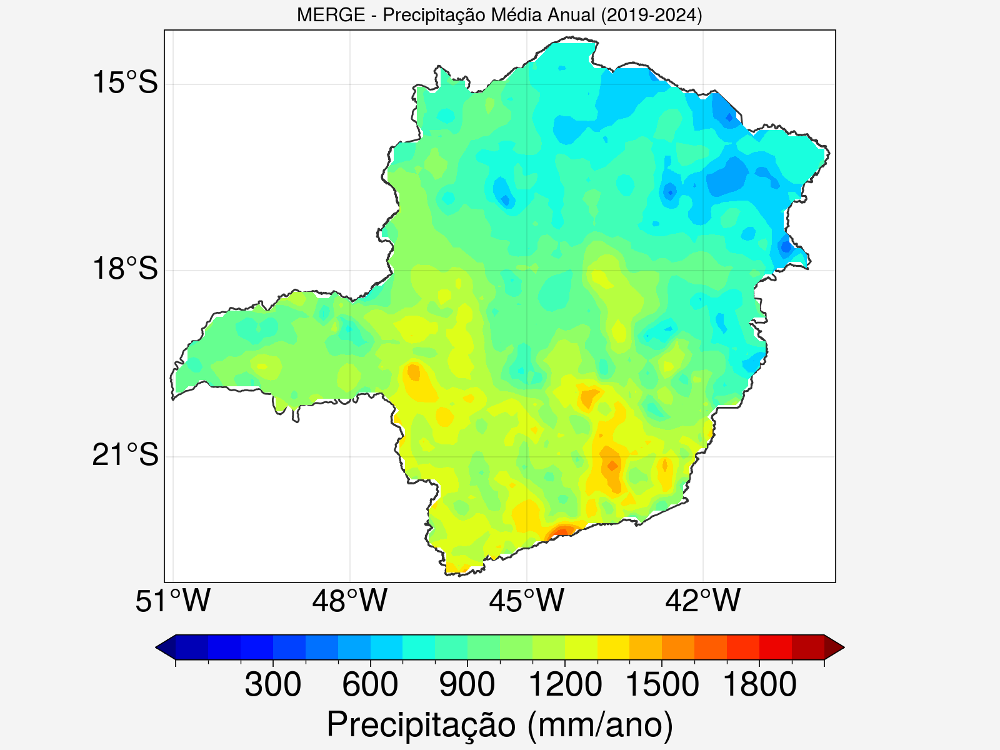

In [ ]:
# Plotando a figura
fig, ax = uplt.subplots(figsize=(8,6), tight=True, proj='pcarree')

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          labels=True,
          latlines=3, lonlines=3,
          latlim=(latmin-0.10, latmax+0.10), lonlim=(lonmin-0.10, lonmax+0.10),
          small='25px', large='15px',
          title = f'MERGE - Precipitação Média Anual ({ano_inicial}-{ano_final})', abc=False)

# plota contorno do Estado de MG
shp.plot(edgecolor='black', facecolor='none', linewidth=1, alpha=0.8, ax=ax)

# plota figura
map1 = ax.contourf(chuva_media_anual['lon'],
                   chuva_media_anual['lat'],
                   chuva_media_anual[:,:],
                   cmap='jet',
                   levels=uplt.arange(0.01, 2000, 100),
                   extend='both')

# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='Precipitação (mm/ano)', ticks=300, ticklabelsize=20, labelsize=20, length=0.70)

# salva figura
fig.savefig(f'{dir}output/Fig_5_MERGE_media_anual.jpg', dpi=300)

###**c) Sazonal**

**Gera estatísticas**

In [ ]:
# reamostra o dado
chuva_media_sazonal = chuva_por_mes['pacum'].groupby("time.season").mean(dim="time")

In [ ]:
# recorta o dado para região
chuva_media_sazonal  = chuva_media_sazonal.salem.roi(shape=shp)

In [ ]:
# mostra o dado
chuva_media_sazonal

<xarray.DataArray 'pacum' (season: 4, lat: 691, lon: 551)> Size: 12MB
dask.array<where, shape=(4, 691, 551), dtype=float64, chunksize=(1, 691, 551), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * season   (season) object 32B 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    pyproj_srs:  +proj=longlat +datum=WGS84 +no_defs

**Plota gráfico**

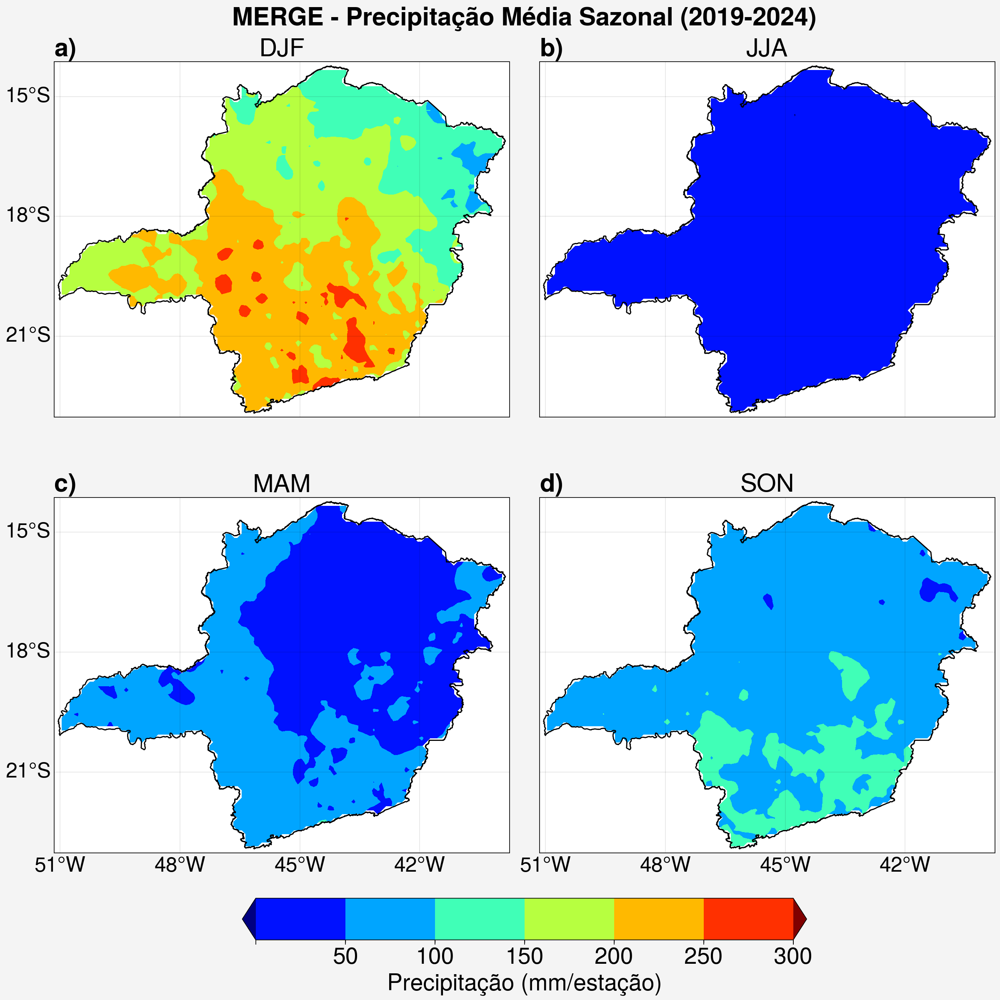

In [ ]:
# cria a moldura da figura
fig, ax = uplt.subplots(figsize=(12,12), nrows=2, ncols=2, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          latlines=3, lonlines=3,
          latlim=(latmin-0.10, latmax+0.10), lonlim=(lonmin-0.10, lonmax+0.10),
          suptitle=f'MERGE - Precipitação Média Sazonal ({ano_inicial}-{ano_final})',
          abc=True, abcstyle='a)', abcsize=5,
          small='25px', large='30px')

# loop das estações
for s in range(len(chuva_media_sazonal)):

    # sigla da estação
    sigla_estacao = chuva_media_sazonal.season[s].values.tolist()

    # plota figura
    map1 = ax[s].contourf(chuva_media_sazonal['lon'],
                          chuva_media_sazonal['lat'],
                          chuva_media_sazonal[s,:,:],
                          cmap='jet', levels=uplt.arange(0.01, 300, 50),
                          extend='both')

    # plota titulo de cada figura
    if(s == 0): ax[s].format(title=sigla_estacao, labels = [True, False, False, False])
    if(s == 1): ax[s].format(title=sigla_estacao, labels = [False, False, False, False])
    if(s == 2): ax[s].format(title=sigla_estacao, labels = [True, False, True, False])
    if(s == 3): ax[s].format(title=sigla_estacao, labels = [False, False, True, False])

    # plota contorno do Estado de MG
    shapefile = list(shpreader.Reader(f'/content/{sigla_estado}_UF_2019.shp').geometries())
    ax[s].add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black',facecolor='none', linewidth=1.0)

# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='Precipitação (mm/estação)', ticks=50, ticklabelsize=20, labelsize=20, space=0.5, length=0.60, width=0.5)

# salva figura
fig.savefig(f'{dir}output/Fig_6_MERGE_media_sazonal.jpg', dpi=300)

###**d) Mensal**

**Gera estatísticas**

In [ ]:
# reamostra o dado
chuva_media_mensal = chuva_por_mes['pacum'].groupby('time.month').mean(dim='time')

In [ ]:
# recorta o dado para região
chuva_media_mensal = chuva_media_mensal.salem.roi(shape=shp)

In [ ]:
# mostra o dado
chuva_media_mensal

<xarray.DataArray 'pacum' (month: 12, lat: 691, lon: 551)> Size: 37MB
dask.array<where, shape=(12, 691, 551), dtype=float64, chunksize=(1, 691, 551), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 4kB -85.05 -84.95 -84.85 ... -30.25 -30.15 -30.05
  * lat      (lat) float64 6kB -56.15 -56.05 -55.95 -55.85 ... 12.65 12.75 12.85
  * month    (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    pyproj_srs:  +proj=longlat +datum=WGS84 +no_defs

**Plota gráfico**

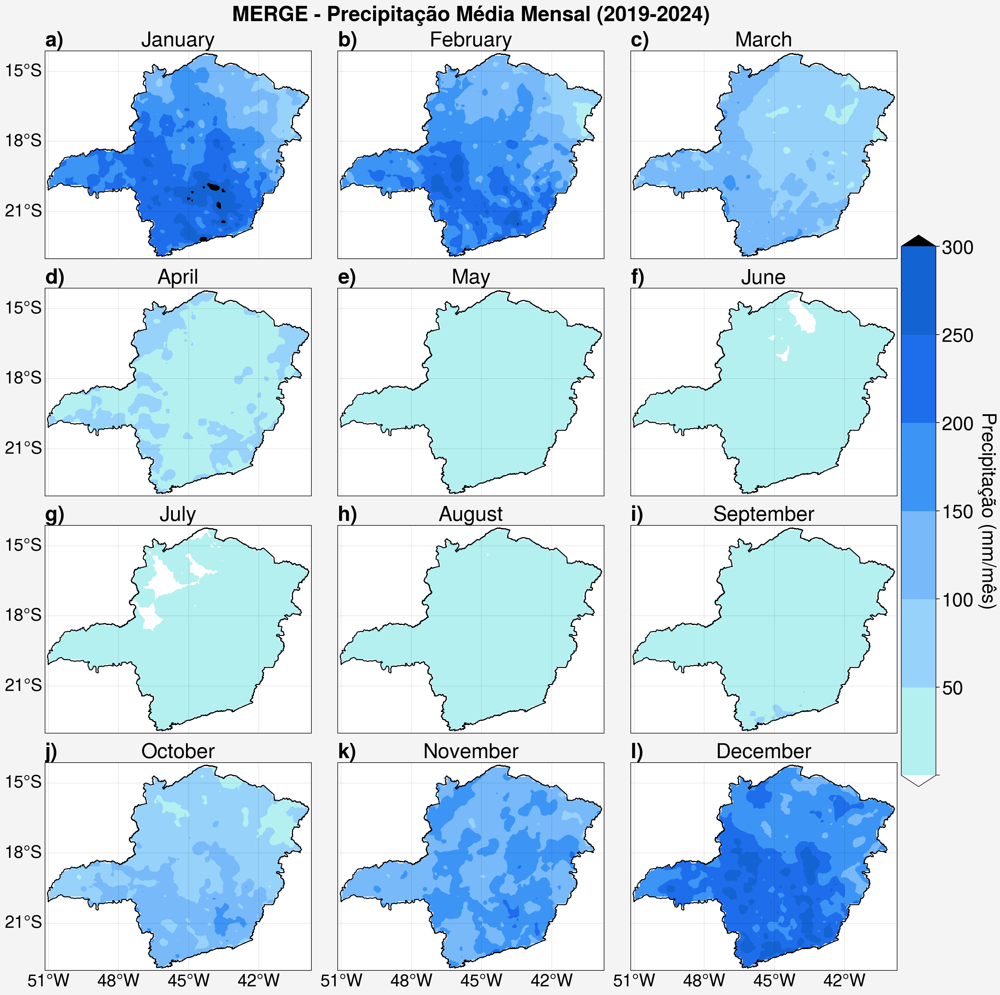

In [ ]:
# cria a moldura da figura
fig, ax = uplt.subplots(ncols=3, nrows=4, axheight=3, tight=True, proj='pcarree', sharex=True, sharey=True)

# formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False,
          latlines=3, lonlines=3,
          latlim=(latmin-0.10, latmax+0.10), lonlim=(lonmin-0.10, lonmax+0.10),
          suptitle=f'MERGE - Precipitação Média Mensal ({ano_inicial}-{ano_final})',
          abc=True, abcstyle='a)', abcsize=5,
          small='25px', large='30px')

# loop dos meses
for m in np.arange(0, 12):

    # nome do mês
    mes = str(m+1).zfill(2)

    # plota figura
    if m == 0:
        map1 = ax[m].contourf(chuva_media_mensal['lon'],
                              chuva_media_mensal['lat'],
                              chuva_media_mensal[m,:,:],
                              cmap=cmap,
                              levels=uplt.arange(0.01, 300, 50),
                              extend='both')
    else:
        ax[m].contourf(chuva_media_mensal['lon'],
                       chuva_media_mensal['lat'],
                       chuva_media_mensal[m,:,:],
                       cmap=cmap,
                       levels=uplt.arange(0.01, 300, 50),
                       extend='both')

    # plota titulo de cada figura
    if (m==1 or m==2 or m==4 or m==5 or m==7 or m==8): ax[m].format(title=calendar.month_name[int(m+1)], labels=False)
    if (m==10 or m==11): ax[m].format(title=calendar.month_name[int(m+1)], labels=[False, False, True, False])
    if (m==0 or m==3 or m==6): ax[m].format(title=calendar.month_name[int(m+1)], labels=[True, False, False, False])
    if (m==9): ax[m].format(title=calendar.month_name[int(m+1)], labels=[True, False, True, False])

    # plota contorno do Estado de MG
    shapefile = list(shpreader.Reader(f'/content/{sigla_estado}_UF_2019.shp').geometries())
    ax[m].add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black',facecolor='none', linewidth=1.0)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', orientation='vertical', label='Precipitação (mm/mês)', ticks=50, ticklabelsize=20, labelsize=20, space=0.5, length=0.60, width=0.5)

# salva figura
fig.savefig(f'{dir}output/Fig_7_MERGE_media_mensal.jpg', dpi=300)